<a href="https://colab.research.google.com/github/pattangeumdduck/stack_study_record/blob/main/aice_professionalstudy11_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Image 처리와 Object Detection
- 사진에서 객체를찾고 그 객체에 대한 분류
- classification / classification + Localization / object Detection / Instant segmentataion
- Two-stage detector(찾고, 분류)(RCNN) 와 One-stage_detector(탐지 분류를 동시에)(YOLO, SSD, Retina-Net) 로 나누어짐
- 객체 탐지의 구성요소 : 영역 추정(regional Proposal), Detection을 위한 Deep Learning 네트웍 구성(Feature Extraction(CNN 등) & FPN(피처피라미드 네트워크) & Network Prediction), Detection을구성하는 기타요소(IOU, NMS,mAP, Anchor box)
- 객체 탐지 모델의 형태 : Backbone(ResNet) + neck(Feature Pyramid Network, FPN) + head(classification ) = 대표적으로 Retina Net

- Regional proposal 방식 : Object가 있을만한 후보 위치를 찾기.
- 대표적 방식으로 :Selective search (segmet gruoping > 개별 segment 를 모아 Bounding box로 만들어서 Region proposal 리스트로 추가 > step.1 유사도가 비슷한 segment들 그루핑 > step.2 Region Proposal 리스트 추가 : 계속 반복하면서 region proposal 수행 head(classification ) = 대표적으로 Retina Net

- Regional proposal 방식 : Object가 있을만한 후보 위치를 찾기.
- 대표적 방식으로 :Selective search (segmet gruoping > 개별 segment 를 모아 Bounding box로 만들어서 Region proposal 리스트로 추가 > step.1 유사도가 비슷한 segment들 그루핑 > step.2 Region Proposal 리스트 추가 : 계속 반복하면서 region proposal 수행

- 객체 탐지의 성능평가 지표 : IoU(Intersection over Union):모델 예측결과가 Ground truth(실제)와 얼마나 겹치는가)
- NMS(Non Max Suppression): Detected된 Object의 Bounding box중에서 비슷한 위치에 있는 box를 제거하고 가장 적합한 box를 선택하는 기법
- NMS의 수행로직 : Detected 된 bounding box별로 특정 confidence threshold이하 bounding box는 먼저 제거 (confidence score < 0.5)
-> 높은 confidence score를 가진 box 순으로 내림차순 정렬하고 아래 로직을 모든 box에 순차적으로 적용(IOU Threshold가 일정 수치 이상이면 모두 제거) -> 남아있는 ox 선택
- Detection 예측 성공 결정 -> IOU로 결정됨 (0.5 초과시)
- 정밀도와 재현율 (Box를 맞춘 비율 :정밀도 / 재현율 : 전체 정답 박스 중 내가 맞춘 비율)
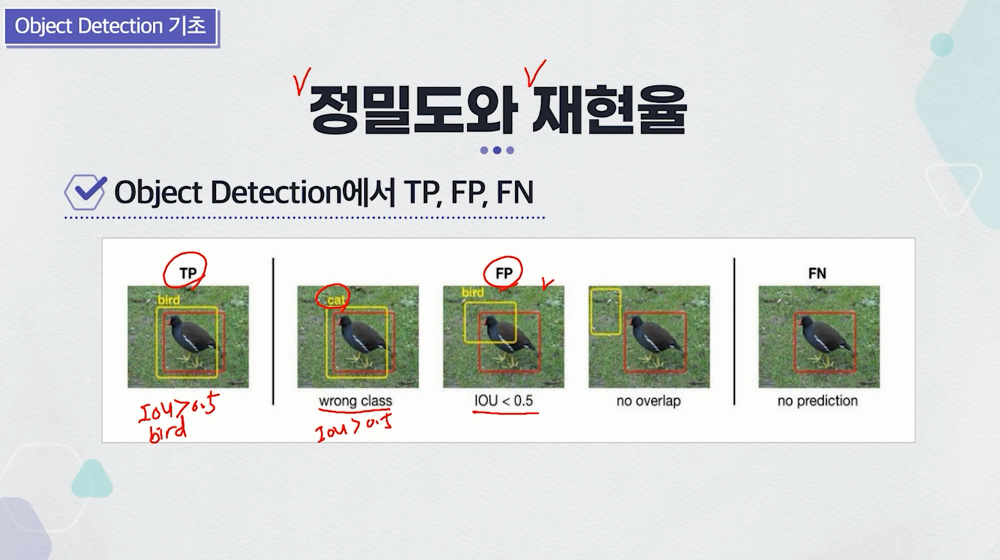

#정밀도와 재현율
- 재현율이 더 중요한 지표인 경우
: 실제 Positive 인 데이터 예측을 Negative로 잘못 하였을 때 업무상 더 큰 영향이 발생하는 경우 (ex. 암 진단, 금융사기 판별)

- 정밀도가 더 중요한 지표인 경우
: 실제 Negative데이터 예측을 Positive로 잘못 판단하였을 때 업무상 큰 영향이 발생하는 경우 (ex. 스팸 메일 판별)

- 정밀도와 재현률은 Threshold에 따른 trade-off 관계임
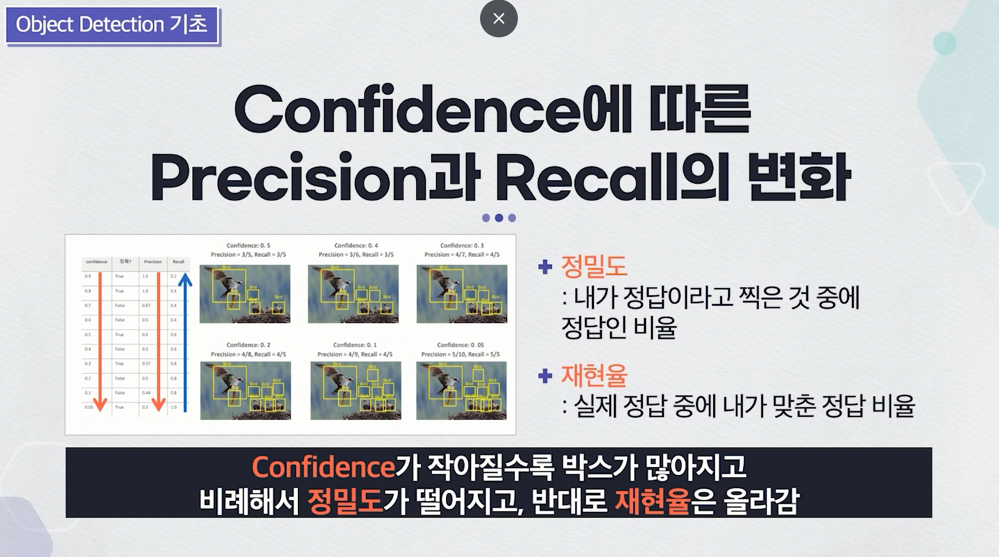

- 둘을 적당히 섞는게 중요(왜 f1-score로 안쓰지,,,)
- AP(Recall-Precision 그래프의 넓이) 통해서 trade-off 관계에서 수치를 정함...
- mAP (mean Average Precision) : 여러 오브젝트들의 AP를 평균한 값, mAP 50의 의미는 IOU 0.5이상인 경우의 mAP 값을 말함...

#Object Detection의 주요 데이터셋
- 많은 Detection과 Segmentation 딥러닝 패키지가 아래 Dataset기반으로 Pretrained 모델을 배포
- XML Format(PASCAL VOC) / json Format(MS COCO) / csv format(Google Open Images)
- Annotation 통해 Object의 Bounding Box(좌표) 위치나 object 이름 등을 특정 포맷으로 제공

#object Detection의 종류
 - 2-Stage Detector : Regional Proposal과 Classification이 순차적으로 이루어짐(R-CNN계열 모델들...)
 - 1-Stage Detector  : 두 과정이 동시에 (Yolo 계열 모델들 / SDD계열 모델들(retinaNet )
 #2- Stage object Detection
 - RCNN : (step1) Selective search 알고리즘으로 입력 사진에서 Region proposal 수행 , (step2) 약 2000여개의 Region을 찾고 같은 사이즈로 변환(warp), (step3) 2000여개의 Region들을 CNN에 의해 분류함, (step4) NMS(Non-maximum suppression)알고리즘을 통해 최적 Region 확정
 - 1개 이미지에 대해서 2000여개의 CNN 수행하고 분류와  Bounty box(예측박스) 예측
 - 문제는 '속도' -> 한 개의 이미지에 대해서 2000번이나 CNN 수행하니 느려질 수 밖에 없음...
 - FeatureMap 내에 매칭된 크기가 다른 Region을 DNN에 넣을 수 없음 :DNN은 일정 크기의 입력을 받을 수 있기 때문(특정 크기의 입력만 받을 수 있음)
 - 그래서 이러한 문제에 대한 개선으로, Feature map으로 투영된 서로 다른 크기를 가진 Region Proposal 이미지를 SPP(spatial Pyramid Pooling) Net을 통해 고정된 크기 제공 (Rol Pooling) 역할
 - SPP(Spatial Pyramid Pooling): Selective Search된 크기가 다른 Feature map이 들어와도 아래와 같이 전체, 4등분 ,16등분으로 나누고 Max pooling 수행: 고정 크기
 -FastRCNN : 1번 CNN 일단하고 Selective search 매핑 진행하고 + 마지막으로 일정 크기를 만드는 (Rol Pooling이나 SPP) -> 기존에 비해 엄청난 속도향상

 - Grid Cell : Feature map의 각 grid cell은 이미지에서 어떤 영역에 대한 정보를 가짐(구획 나눠서 Box 표시한 정보판)
 - Faster RCNN = Fast RCNN + RPN  : Fast RCNN 의 병목(Bottle-neck)부분이었던 Selective search 를 신경망구조로 변경함 -> RPN(Region Proposal Network), selective search 를 제거하고 RPN을 통해 물체가 있을만한 box를 찾아 주게 됨
 - 그리드 셀에 대한 확률 좌표를 예측하여 박스를 그림(anchor box)
 - 9개의 박스에 대해서 객체가 있는가 없는가를 체크하게 됨

 # 1-Stage object Detection
 - YOLO : 7 * 7 피쳐맵에서 각 그리드에서 2개 (RPN에선 9개의 앵커박스를 사용함)(49 *2 = 98개의 객체 박스 생성)
 - SDD :  38*38 19*19 10*10 5*5 3*3 1*1 의 피쳐맵에 대해 각 Grid에서 4개 혹은 6개 앵커박스 생성 후 객체 위치와 class 분류를 수행함 -> 9732 Box 생성
 - YOLO(You Only Look Once): 1-stage detector 방식으로 기존 모델보다 빠른 성능으로 실시간 객체 검출이 가능함... but 작은 객체의 인식률이 떨어진다는 단점을 가짐.
 - 7 * 7* 30의 FeatureMap 정보 :Grid Cell(7 * 7) 마다 + 2개 BB((좌표 + confidence =5) + class 정보(20)) 에 대해 NMS(Non Maximum Suppression) 수행
 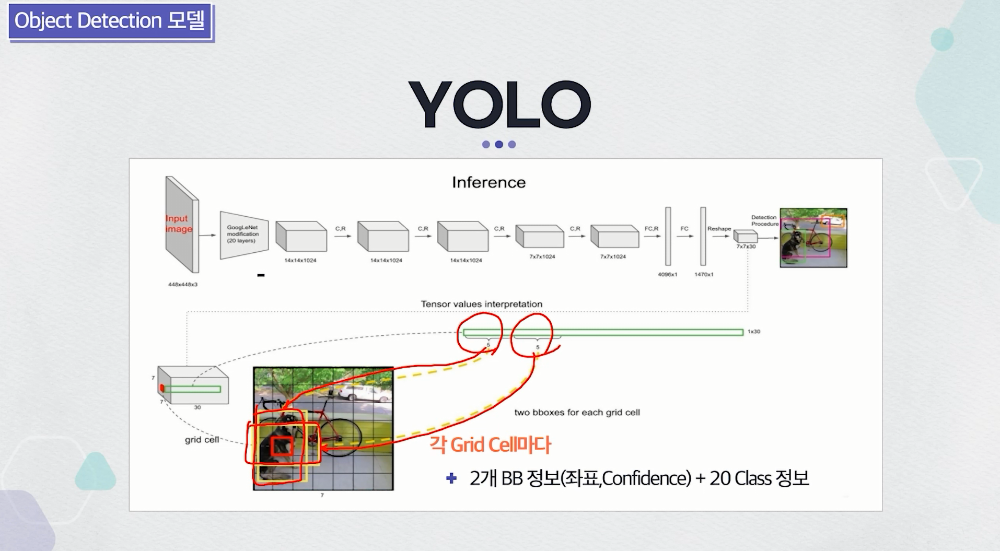

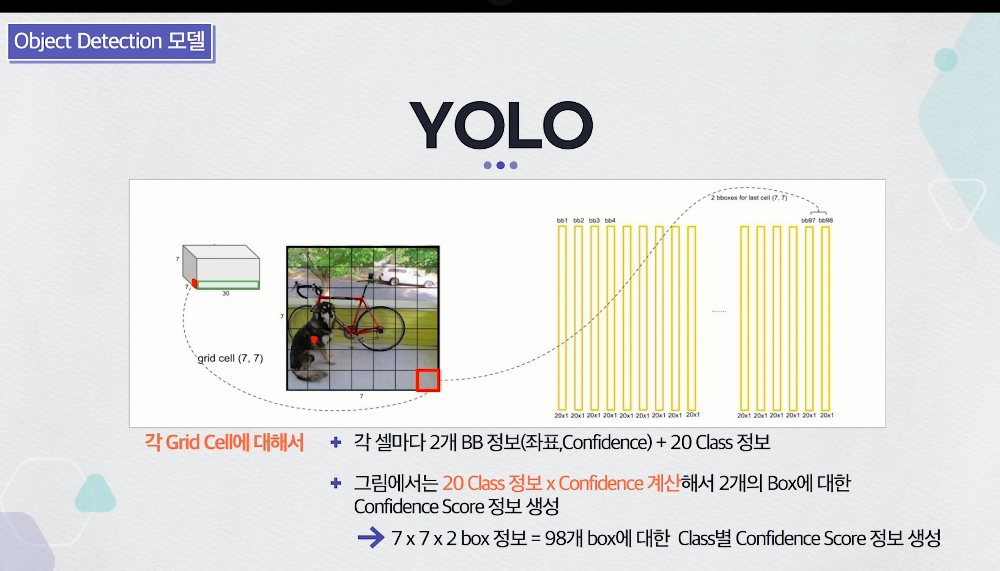

# YOLO 계속...
 - 뒤에 20개 class 정보는 dog , human등 분류모형의 class에 대한 Confidence score가 들어감
 - info[0] 정보는 Dog class에 대한 98개 confidence score이며, confidence score가 0.2보다 작으면 0으로 변경 후 confidence score 정렬하고 NMS 적용하여 제일 높은 confidence score 정보 기준으로 중복되고 낮은 confidence score를 0으로 변경
 - Max-Box(확률 가장 높은 박스), Current_Box(확률 두번 째로 높은 박스) 의 둘이 IOU가(겹치는 부분) 0.5보다 크녀 같은 객체를 가르킨다고 판단함 이후 계속 NMS를 시행하면 최종적으로 남을 Box 선택 가능...

 # SDD(Single Shot multibox Detector)
  - 기존 YOLO는 입력 이미지를 7 * 7크기의 그리드로 나누고 각 그리드 셀마다 2개의 BB를 진행하였음 -> 작은 물체 탐지 어려움...
  - 7 * 7 피처맵은 추상화가 높아 정확도가 하락함...
  - YOLO의 한계점을 극복하고자 노력 -> feature map을 multi-scale로 이용하여  이용 (38 * 38, 19 * 19, 10 * 10, 5 * 5 , 3 * 3 , 1 * 1 )의 다양한 피처맵 이용해 object detection 수행
  - Base network : VGG - 16
  - Multi -scale feature map생성함 -> 작은 객체부터 큰 객체까지 탐지
  - 큰물체는 큰 스케일의 피처맵, 작은 객체는 작은스케일의 피처맵!!
  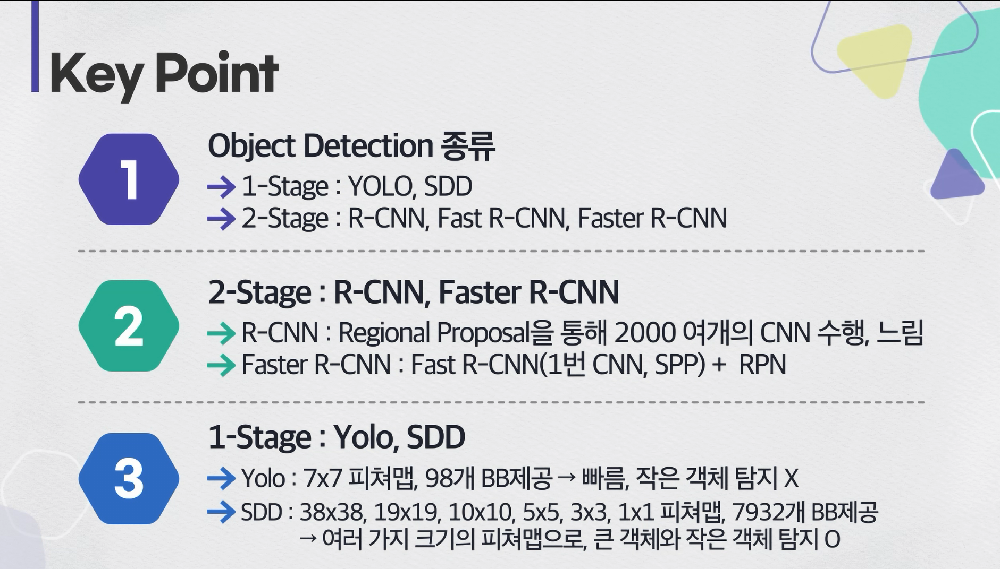

# Oxford Pet 데이터셋 가지고 localization(BBOX)하기
 - 단순하게, 입력 펫 이미지를 받고 객체의 X, Y 좌표 회귀하는 모델을 만들어 보기(이미지 분류는 제외)
 - 이론에서 배운 Regional Proposal이나 RPN 네트워크 구성이 포함되고 학습 완료된 Yolo,SSD 모델의 파라미터를 가져와서 FIne Tunning하여 사용함
 - 처음부터 끝까지 개발할 필요 없이 이미 학습 완료된 Yolo, SSD 모델 사용해서 객체탐지 연습해보기!

 <학습목차>
  1. import modules
  2. 데이터 준비하기
  3. 이미지 정보로 DataFrame 만들기 : 이미지 패스, label ,위치정보(x,y,w,h)생성
  4. 실제 이미지의 Bbox 그려보기(Localization)
  5. CNN 모델로 Localization 학습하기
  6. pretrained MobileNet V2사용하여 학습하기

  #Bounding Box 위치 이해
  - Oxford Pet 데이터에서 Bounding Box 위치를 이미지 사이즈에서의 실위치를 xmin, ymin, xmax, ymax 형태로 저장된다.
  - 저장된 Bounding box 위치를 내부 저장시 0 ~ 1 사이의 값으로 변환하여 x, y(중앙), w, h형태로 저장한다.
  - matplotlib Rectangle 이용하여 사각형 그릴 경우, 내부 저장된 BBOX 위치를 이미지 사이즈에서의 실위치로 변환하여 xmin, ymin, w, h형태로 표

In [ ]:
#import modules
import tensorflow as tf
import pandas as pd
import numpy as np
import os
import re
from PIL import Image # 텐서플로우로  리드 이미지 하는 방법중 하나
from glob import glob
import shutil #복사때 쓰는것...
import xml.etree.ElementTree as et #나중에 xy 좌표를 annotation file로 저장하는데 xml로 저장되어 읽을 떄 필요함.
import random
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

In [ ]:
#e데이터 준비하기
glob('oxford_pet.zip')

['oxford_pet.zip']

In [ ]:
## 압축풀기
if not os.path.exists('/content/oxford_pet'):
  !unzip -q oxford_pet.zip -d oxford_pet

[oxford_pet.zip]
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of oxford_pet.zip or
        oxford_pet.zip.zip, and cannot find oxford_pet.zip.ZIP, period.


In [ ]:
#압축이 풀린 directory 확인
!ls oxford_pet

ls: cannot access 'oxford_pet': No such file or directory


In [ ]:
## directory 정보
cur_dir = os.getcwd()
data_dir = os.path.join(cur_dir, 'oxford_pet')
image_dir = os.path.join(data_dir, 'images')
bbox_dir = os.path.join(data_dir, 'annotations', 'xml') #BBOX 정보
seg_dir = os.path.join(data_dir, 'annotations', 'trimaps') #Segmentation 정보

In [ ]:
#프린트로 확인해보자
print('data_dir:' , data_dir)
print('image_dir:', image_dir)
print('bbox_dir:', bbox_dir)
print('seg_dir:', seg_dir)

In [ ]:
##image file 수 확인
image_files = [fname for fname in glob(image_dir + '/*.jpg') if os.path.splitext(fname)[-1] == '.jpg']
print(len(image_files))

In [ ]:
#localization위한 annotation 되어있는 file 수 확인
# 위의 이미지 갯수보다 annotation XML 파일 갯수가 적다. annotation XML 파일을 기준으로 해야함.
bbox_files = [fname for fname in glob(bbox_dir + '/*.xml') if os.path.splitext(fname)[-1] == '.xml']
print(len(bbox_files))

In [ ]:
#600 bbox 와 매칭되는 이미지를 모으기 위한 새로운 폴더 (new_images)생성
new_image_dir = os.path.join(data_dir, 'new_images')
os.makedirs(new_image_dir, exist_ok=True)

print('new_images:', new_images_dir)

In [ ]:
#BB 정보를 가지고 있는 xml 파일 보기
bbox_files[:10] #xml로 이름 가져오기... 다음 함수에서 xml을 jpg 붙여서 이름 같은 이미지 복사

In [ ]:
#600 bbox 리스트 읽어 bbox 이름과 같은 이미지를 new_images 폴더에 복사한다.
for bbox_filename in bbox_files:
  bbox_filename = bbox_filename.split('/')[-1]
  image_name = os.path.splitext(bbox_filename)[0]
  image_file = image_dir + '/' + image_name + '.jpg'
  #print(glob(image_file))
  shutil.copy(image_file, new_image_dir)

In [ ]:
#new_images 폴더에 복사된 이미지 건수를 카운트한다.
new_image_files  = glob(new_image_dir + '/*')
len(new_image_files)

In [ ]:
# 600개의 새로 복사된 이미지 리스트
new_image_files[:10]

In [ ]:
#이미지 정보로 데이터프레임만들기 : 이미지 패스, 라벨 ,위치정보 생성
#데이터프레임 만들기
pets_df = pd.DataFrame(new_image_files)
pets_df

In [ ]:
#컬럼명 입력

pets_df.columns = ['full_path']
pets_df.head(3)

In [ ]:
##full_path 컬럼에서 이미지 이름을 분리하여 file_name 컬럼명에 저장
pets_df['file_name'] = pets_df['full_path'].str.split('/').str[-1] #잘라서 맨 끝에 것만 가져오겠다.
pets_df.head(3)

In [ ]:
#file_name 컬럼에서 라벨 분리하여 label 컬럼에 저장
pets_df['label'] = pets_df['file_name'].str.replace('_\d+','').str.split('.').str[0]
pets_df.head(3)

In [ ]:
pets_df.head(10)

In [ ]:
#이미지 파일명을 입력으로 받아, 같은 이름과 xml 확장자로 변경해서 리턴하는 함수

def name_convert(col):
  bbox_fname = bbox_dir + '/' + col.replace('jpg', 'xml')
  return bbox_fname

# name_convert 함수 호출해서 이미지 파일명과 같은 이름의 xml 확장자로 만든다.
pets_df['bbox_full_path'] = pets_df['file_name'].apply(name_convert)
pets_df.head(3)

In [ ]:
#name_convert 함수 호출해서 이미지 파일명과 같은 이름의 xml 확장자로 만든다.
pets_df['bbox_full_path'] = pets_df['file_name'].apply(name_convert)
pets_df.head(3)

In [ ]:
#pets_df 데이터 구조 파악
pets_df['bbox_full_path']
pets_df.info()



In [ ]:
#label 분포 확인
# 각 class 마다 200개의 이미지로 구성됨
pets_df['label'].value_counts()

In [ ]:
# bbox_full_path 컬럼의 첫 번쨰 데이터 가져오고 해당 내용 보기
sample_xml_file = pets_df.loc[0, 'bbox_full_path']
print(sample_xml_file)

!cat {sample_xml_file}

In [ ]:
#1. xml, Annotattion 파일 읽어 이미지 크기와 Bounding box 위치를 파악함
#2. xmin, ymin, xmax, ymax 형태를 x, y(중앙), w, h형태로 변환하여 저장

def xml_annot_getxywh(xmlfile):
  tree = et.parse(xmlfile)

  width = float(tree.find('./size/width').text)
  height = float(tree.find('./size/height').text)

  xmin = float(tree.find('./object/bndbox/xmin').text)
  ymin = float(tree.find('./object/bndbox/ymin').text)

  xmax = float(tree.find('./object/bndbox/xmax').text)
  ymax = float(tree.find('./object/bndbox/ymax').text)

  xc = (xmin + xmax) / 2 / width
  yc = (ymin + ymax) / 2 / height
  x = xc / width
  y = yc / height
  w = (xmax - xmin) / width
  h = (ymax - ymin) / height

  return x, y, w, h

In [ ]:
# 샘플 xml 파일에 대한 x, y, w, h 얻어오기

xml_annot_getxtwh(sample_xml_file)

In [ ]:
pets_df

In [ ]:
#xml annot 파일의 x, y, w, h 위치 정보를 가져와 DataFrame에 저장한다.

pets_df['xywh']  = pets_df['bbox_full_path'].apply(xml_annot_getxywh)
pets_df.head()

In [ ]:
#튜플로 저장된 xywh 컬럼 값들을 하나씩 x, y, w, h컬럼에 저장한다.
pets_df['x'] = pets_df['xywh'].str[0]
pets_df['y'] = pets_df['xywh'].str[1]
pets_df['w'] = pets_df['xywh'].str[2]
pets_df['h'] = pets_df['xywh'].str[3]
pets_df.head

In [ ]:
#label에 대한 라벨인코딩 수행
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
pets_df['label_enc'] = le.fit_transform(pets_df['label'])
pets_df.head()

In [ ]:
#class 와 idx간의 변환
class2idx = { label : idx for idx, label in enumerate(le.classes_)}
idx2class = { idx : label for idx, label in enumerate(le.classes_)}
print(class2idx)
print(idx2class)

In [ ]:
#PIL 라이브러리 사용하여 이미지 파일 리스트에서 이미지 패스에 있는 이미지 읽고 리스트에 넣는다
# 이미지 resize로 맞추지 않으면 뒤쪽에서 Tensor 에러 발생함

x_image_list = []

for fname in image_list:
  image = Image.open(fname)
  image = image.resize((224, 224))
  image = np.array(image)

  x_image_list.append(image)

x_image_list = np.array(x_image_list)

NameError: name 'image_list' is not defined

In [ ]:


x_image_list.shape


In [ ]:
#라벨값과 bbox 위치값 저장
y1_label = pets_df['label_enc'].values
y2_xywh = pets_df[['x', 'y', 'w', 'h']].values

In [ ]:
y1_label[:4]

In [ ]:
y2_xywh[:4]

In [ ]:
#하이퍼 파라미터 설정
IMG_SIZE = 224
N_BBOX = len(x_image_list)
N_TRAIN = 200
N_VAL = N_BBOX - N_TRAIN

In [ ]:
# Annotation XML 파일 갯수로 리스트 만들고 shuffle 하고 500개 Train set과 100개 Valid set으로 나뉨
shuffle_list = list(range(N_BBOX))
random.shuffle(shuffle_list)

train_idx_list = shuffle_list[:N_TRAIN]
val_idx_list = shuffle_list[N_TRAIN:]

train_idx_list[:10]

In [ ]:
#Train dataset 만들기
train_image_list = x_image_list[train_idx_list]
train_y1_label = y1_label[train_idx_list]
train_y2_xywh = y2_xywh[train_idx_list]

#valid 데이터셋 만들기
valid_image_list = x_image_list[val_idx_list]
valid_y1_label = y1_label[val_idx_list]
valid_y2_xywh = y2_xywh[val_idx_list]

train_image_list.shape, valid_image_list.shape

In [ ]:
#이미지와 X/Y/W/H 정보를 가지고 Train / Valid Dataset 만들기
train_dataset_image = tf.data.Dataset.from_tensor_slices((train_image_list, train_y1_label, train_y2_xywh))
valid_dataset_image = tf.data.Dataset.from_tensor_slices((valid_image_list, valid_y1_label, valid_y2_xywh))

#from_tensor_slices 읽어들인 이미지 리스트와 1개 y 값들을 배치, 셔플함

train_dataset = train_dataset_image.batch(16).shuffle(1000).cahce().prefetch(AUTOTUNE)
valid_dataset = valid_dataset_image.batch(16).cache().prefetch(AUTOTUNE)

In [ ]:
#실제 이미지의 Bbox 그려보기
#Hyper parameters

N_CLASS = len(class2idx)
N_EPOCHS = 40
N_BATCH = 16
IMG_SIZE = 224
learning_rate = 0.0001
steps_per_epoch = N_TRAIN /N_BATCH
validation_stpes = int(np.ceil(N_VAL / N_BATCH))

In [ ]:
#valid_dataset에서 1개 가져와 분석해보기
#이미지와 라벨로 받고 라벨은 다시 실제 라벨과 x,y,w,h 위치 값으로 나눔

for image, label in valid_dataset.take(1):
  print(image.shape)
  print(label.shape)

In [ ]:
#train dataset에서 1개의 이미지와 bbox를 읽어서 확인하기

for image, label in valid_dataset.take(1):
  '''Matplotlib Rectangle이용해 사각형 그릴경우 ,
  그림을 그리기 위해서 bbox 왼쪽 아래 (xmin, ymin) 꼭지점 좌표 계산하고,
  xmin, ymin w, h 각각을 image size에 맞게 scaling

  '''
  x = label[:,0]
  y = label[:,1]
  w = label[:,2]
  h = label[:,3]
  xmin = x[0].numpy() - w[0].numpy()/2.
  ymin = y[0].numpy() - h[0].numpy()/2.
  rect_x = int(xmin * IMG_SIZE)
  rect_y = int(ymin * IMG_SIZE)
  rect_w = int(w[0].numpy() * IMG_SIZE)
  rect_h = int(h[0].numpy() * IMG_SIZE)

  # 그림 그리기
  rect = Rectangle((rect_x, rect_y), rect_w, rect_h, fill = False, color ='red')
  plt.axes().add_patch(rect)
  plt.imshow(image[0])
  plt.show()

In [ ]:
#CNN 모델로 Localizatuon 학습하기(Sequential API)
def create_model():
  model = tf.keras.models.Sequential()
  model.add(tf.keras.layers.Conv2D(filters = 32, kernal_size = 3, activation='relu',padding ='SAME', input_shape=(IMG_SIZE, IMG_SIZE,3)))
  model.add(tf.keras.layers.MaxPool2d(padding = 'SAME'))
  model.add(tf.keras.layers.Conv2D(filters = 64, kernal_size = 3, activation='relu',padding ='SAME'))
  model.add(tf.keras.layers.MaxPool2d(padding = 'SAME'))
  model.add(tf.keras.layers.Conv2D(filters = 128, kernal_size = 3, activation='relu',padding ='SAME'))
  model.add(tf.keras.layers.MaxPool2d(padding = 'SAME'))
  model.add(tf.keras.layers.Conv2D(filters = 256, kernal_size = 3, activation='relu',padding ='SAME'))
  model.add(tf.keras.layers.MaxPool2d(padding = 'SAME'))
  model.add(tf.keras.layers.Flatten())
  model.add(tf.keras.layers.Dense(1024, activation='relu'))
  model.add(tf.keras.layers.Dropout(0.4))
  model.add(tf.keras.layers.Dense(4, activation='sigmoid'))
  return model

In [ ]:
#Create model, compile & summary

model = create_model()
model.summary()

In [ ]:
def loss_fn(y_true, y_pred ):
  return tf.keras.losses.mean_squared_error(y_true, y_pred)

In [ ]:
#leartning rate scheduling
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=learning_rate, decay_steps=steps_per_epochs*10, decay_rate=0.5, staircase=True)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule), loss=loss_fn, metrics=['accuracy'])

In [1]:
#callbacks
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience =3 ,vsrbose =1)
mc = tf.keras.callbacks.ModelCheckpoint('best_model_{val_loss:.2f}.h5', monitor ='val_loss', save_best_only = True, verbose =1)

NameError: name 'tf' is not defined

In [ ]:
#Tran
model.fit(train_dataset, steps_per_epoch = steps_per_epoch,
          validation_data = valid_dataset,
          validation_steps = validation_steps,
          epochs = N_EPOCHS,
          callbacks = [es, mc])

In [ ]:
#pretrained MobileNet V2 이용하여 학습하기
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Conv2D, ReLU, MaxPooling2D,Dense, BatchNormalization, GlobalAveragePooling2D, Dropout, Flatten

In [ ]:
mobilenetv2 = MobileNetV2(weights = 'imagenet', include_top = False, input_shape = (IMG_SIZE, IMG_SIZE, 3))

In [ ]:
mobilenetv2.summary()

In [ ]:
def create_my_model():
  model = models.Sequential()
  model.add(mobilenetv2)
  model.add(GlobalAveragePooling2D()
  model.add(Dense(4, activation='sigmoid'))
  return model

In [ ]:
#create model, compile & summary
model = create_my_model()
model.summary()

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=learning_rate,
                                                             decay_steps=steps_per_epoch*10,
                                                             decay_rate=0.5,
                                                             staircase=True)

modele.compile(optimizer = tf.keras.optimizers.Adam(lr_schedule),
               loss = 'categorical_crossentropy',
               metrics = ['accuracy'])
#callbacks
es = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience =3 , verbose =1)
mc = tf.keras.callbacks.ModelCheckpoint('best_model_{val_loss:.2f}.h5', monitor ='val_loss', save_best_only = True, verbose =1)

In [ ]:
#Train
model.fit(train_dataset, steps_per_epoch = steps_per_epoch,
          validation_data = valid_dataset,
          validation_steps = validation_steps,
          callbacks = [es, mc])

In [ ]:
#예측한 bounding box와 ground truth box를 image에 같이 표시
# 정답은 빨간색 box, 예측은 파란색 box

idx = 0
num_imgs = validation_steps
for val_data, val_gt in valid_dataset.take(num_imgs):
  #정답 box 그리기 : 빨강박스
  x = val_gt[:, 0]
  y = val_gt[:,1]
  w = val_gt[:,2]
  h = val_gt[:,3]
  xmin = x[idx].numpy() - w[idx].numpy()/2.
  ymin = y[idx].numpy() - h[idx].numpy()/2.
  rect_x = int(xmin * IMG_SIZE)
  rect_y = int(ymin * IMG_SIZE)
  rect_w = int(w[idx].numpy() * IMG_SIZE)
  rect_h = int(h[idx].numpy() * IMG_SIZE)

  rect = Rectangle((rect_x, rect_y), rect_w, rect_h, fill = False, color ='red')
  plt.axes(),add_patch(rect)

  #예측 box 그리기 : 파랑박스
  #validation set에 대해서 bounding box 예측하기
  prediction = model.predict(val_data)
  pred_x = prediction[:,0]
  pred_y = prediction[:,1]
  pred_w = prediction[:,2]
  pred_h = prediction[:,3]
  pred_xmin = pred_x[idx] - pred_w[idx]/2.
  pred_ymin = pred_y[idx] - pred_h[idx]/2.
  pred_rect_x = int(pred_xmin * IMG_SIZE)
  pred_rect_y = int(pred_ymin * IMG_SIZE)
  pred_rect_w = int(pred_w[idx] * IMG_SIZE)
  pred_rect_h = int(pred_h[idx] * IMG_SIZE)

  pred_rect = Rectangle((pred_rect_x, pred_rect_y), pred_rect_w, pred_rect_h, fill = False, color ='blue')
  plt.axes().add_patch(pred_rect)

  #image와 bbox 함께 출력
  plt.imshow(val_data[idx])
  plt.show()

#배운 내용 정리
  1. Oxford Pet 데이터셋 가지고 Localization 실습
  2. 이미지 파일과 BBOX 정보 xml 파일을 가지고 DataFrame 만들기 : 이미지패스, label, 위치정보(x,y,w,h) 생성
  3. 실제 이미지의 Bbox 그려보기 (localization)
  4. CNN 모델로 localization 학습하고
  5. 성능 향상을 위한 Pretrained MobileNetV2 사용하여 학습해봄
  6. Localization BBox 찾는 객체 탐지가 생각보다 성능이 별로임

  

# Oxford Pet 데이터셋 가지고 Localization, Classification하기
 - 옥스퍼드 펫 데이터셋을 가지고 Localization 수행
 - 1개의 이미지 입력을 받아 x,y,w,h 위치 좌표와 class 정보 출력하는 모델링 만들기
 - 모델 생성시 2개의 출력값(위치와 calss 정보)를 Concatenate로 1개로 묶게 되며
 - 커스텀 loss function만들어 위치 정보와 class 정보에 대해 각각 loss 계산해 합치기


 **<학습목차>**
 1. import modules
 2. 데이터 준비하기
 3.DataFrame에 이미지패스, 클래스정보, 위치정보(x,y,w,h)담기
 4. 실제 이미지의 Bbox 그려보기
 5. CNN모델로 Localization, classification 학습하기
 6. Pretrained MobileNetV2이용하여 Localization , Classification 학습하기



In [ ]:
#import modules
import tensorflow as tf
import pandas as pd
import numpy as np
import os
import re
from PIL import Image
from glob import glob
import shutil
import xml.etree.ElementTree as et
import random
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from sklearn.preprocessing import LabelEncoder


In [ ]:
glob('oxford_pet.zip')

In [1]:
#압축풀기
if not os.path.exists('./oxford_pet'):
  !numzip -1 oxford_pet.zip -d oxford_pet

NameError: name 'os' is not defined

In [ ]:
#압축 잘 풀렸나 확인
!ls oxford_pet

In [1]:
#directory 정보
cur_dir = os.getcwd()
data_dir = os.path.join(cur_dir, 'oxford_pet')
image_dir = os.path.join(data_dir, 'images')
bbox_dir = os.path.join(data_dir, 'annotations', 'xmls') #BBOX 정보
new_image_dir = os.path.join(data_dir, 'annotations', 'trimaps') #새로 복사된 이미지

NameError: name 'os' is not defined

In [ ]:
print('data_dir:', data_dir)
print('image_dir:', image_dir)
print('bbox_dir:', bbox_dir)
print('seg_dir:', seg_dir)

In [ ]:
#image file 수 확인
image_files = [fname for fname in glob(image_dir + '/*.jpg') if os.path.splitext(fname)[-1] == '.jpg']
print9len(len(image_files))

In [ ]:
#localization을 위한 annotation이 되어있는 file 수 확인
#위의 이미지 개수보대 annotation XML 파일 갯수가 적음 , annotation XML 파일을 기준으로 해야함
bbox_files = [fname for fname in glob(bbox_dir + '/*.xml') if os.path.splitext(fname)[-1] == '.xml']
print(len(bbox_files))

In [ ]:
# 600 bbox와 매칭되는 이미지를 모으기 위한 새로운 폴더(new_images) 생성
new_image_dir = os.path.join(data_dir, 'new_images')
os.makedirs(new_image_dir, exist_ok = True)

print('new_images:', new_image_dir)

In [ ]:
#600 bbox 리스트 읽어 bbox 이름과 같은 이미지를 new_images 포더에 복사하기
for bbox_filename in bbox_files:
  bbox_filename = bbox_filename.split('/')[-1]
  image_name = os.path.splitext(bbox_filename)[0]
  image_file = image_dir + '/' + image_name + '.jpg'

  #print(glob(image_file))
  shutil.copy(image_file, new_image_dir)

# new_images 폴더에 복사된 이미지 건수를 카운트한다.
new_image_files = glob(new_image_dir + '/*')
print(len(new_image_files))


In [ ]:
#600개의 새로 복사된 이미지 리스트
new_image_files[:10]

In [ ]:
#DataFrame에 이미지패스 ,class정보, 위치정보 담기
#데이터 프레임 만들기
pets_df = pd.DataFrame(new_images_files)
pets_df

In [ ]:
#컬럼명 입력
pets_df .columns = ['full_path']
pets_df.head(3)

In [ ]:
# full_path 컬럼에서 이미지 이름을 분리하여 file_name 컬럼명에 저장
#pets_df['file_name'] = pets_df['full_path'].apply(lambda x: x.split('/')[-1])
pets_df['file_name'] = pets_df['full_path'].str.split('/').str[-1]
pets_df.head(3)

In [ ]:
#file_name 컬럼에서 라벨 분리하여 label 컬럼에 저장
pets_df['label'] = pets_df['file_name'].str.replace('_\d+.jpg', '').str.split('.').str[0]
pets_df.head(10)

In [ ]:
#이미지 파일명을 입력으로 받아, 같은 이름과 xml 확장자로, 그리고 xml 위치로 변경해서 리턴

def name_convert(col):
  bbox_fname = bbox_dir + '/' + col.replace('jpg', 'xml')
  return bbox_fname

#name_convert 함수 호출해서 이미지 파일명과 같은 이름의 xml 확장자로 만든다.
pets_df['bbox_full_path'] = pets_df['file_name'].apply(name_convert)
pets_df.head()

In [ ]:
# pets_df 데이터 구조 파악
pets_df.info()

In [ ]:
#label 분포 확인
pets_df['label'].value_counts()

In [ ]:
#bbox_full_path 컬럼의 첫 번째 데이터 가져오고 해당 내용 보기
sample_xml_file = pets_df.loc[0,'bbox_full_path']
sample_xml_file
!cat/ contetn/oxford_pet/annotation/xmls/boxer_11.xml

In [ ]:
#xml Annotation 파일 읽어 이미지 크기와 Bounding box 위치 파악
# xmin, ymin, xmax,ymax 형태를 x, y(중앙), w, h 형태로 변환하여 저장
def xml_annnot_getxywh(xmlfile):
  tree = et.parse(xmlfile)

  width = float(tree.find('./size/width'). text)
  height = float(tree.find('./size/height').text)
  xmin = float(tree.find('./object/bndbox/xmin').text)
  ymin = float(tree.find('./object/bndbox/ymin').text)
  xmax = float(tree.find('./object/bndbox/xmax').text)
  ymax = float(tree.find('./object/bndbox/ymax').text)
  xc = (xmin + xmax)/2.
  yc = (ymin + ymax)/2.
  w = xmax - xmin
  h = ymax - ymin

  x = xc/width
  y = yc/height

  w = xmax - xmin
  h = ymax - ymin
  return x, y, w, h

In [ ]:
#샘플 xml 파일에 대한 x, y, w, h 얻어오기
xml_annot_getxywh(sample_xml_file)

In [ ]:
pets_df.head(2)

In [ ]:
#xml Annot 파일의 x, y, w, h 위치 정보를 가져와 DataFrame에 저장한다.

pets_df['xywh'] = pets_df['bbox_full_path'].apply(xml_annot_getxywh)
pets_df.head()

In [ ]:
#튜플로 저장된 xywh컬럼 값들을 하나씩 x, y, w, h 컬럼에 저장된다.
pets_df['x'] = pets_df['xywh'].str[0]
pets_df['y'] = pets_df['xywh'].str[1]
pets_df['w'] = pets_df['xywh'].str[2]
pets_df['h'] = pets_df['xywh'].str[3]
pets_df.head()

In [ ]:
#label에 대한 라벨인코딩 수행
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
pets_df['label_conv'] = le.fit_transform(pets_df['label'])
pets_df.head()

In [ ]:
pets_df.head(3)

In [ ]:
#class와 idx간의 변환
class2idx = { label : idx for idx, label in enumerate(le.classes_)}
idx2class = { idx : label for idx, label in enumerate(le.classes_)}
print(class2idx)
print(idx2class)

In [ ]:
#이미지 패스 리스트 만들기
images_list = pets_df['full_path'].values


In [ ]:
#이미지 파일 리스트에서 이미지 패스로 해당 이미지 읽고 리스트에 넣는다/
#이미지 resize로 맞추지 않으면 뒤쪽에서 Tensor 에러 발생함...
x_image_list = []
for fname in images_list:
  image = Image.open(fname)
  image = image.resize((224,224))
  image = np.array(image)

  x_image_list.append(image)

x_image_list = np.array(x_image_list)

In [ ]:
#덪체 이미지 리스트 형태 보기
x_image_list.shape, type(x_image_list)

In [ ]:
#이미지 라벨값과 bbox 위치값 같이 저장
y1_label = pets_df[['x', 'y' , 'w', 'h', 'label_conv']].values

y1_label[:4]

In [ ]:
IMG_SIZE = 224
N_BBOX = len(x_image_list)
N_TRAIN = 500
N_VAL = N_BBOX - N_TRAIN

In [ ]:
#Annotation XML 파일 갯수로 리스트 만들고 shuffle후 500개 Train set 과 100개 valid set으로 나눈다.
shuffle_list = list(range(N_BBOX))
random.shuffle(shuffle_list)

train_idx_list = shuffle_list[:N_TRAIN]
val_idx_list = shuffle_list[N_TRAIN:]

#Train set idx 보기
train_idx_list[:4]

In [ ]:
#train 데이터셋 만들기
train_image_list = x_image_list[train_idx_list]
train_label_list = y1_label[train_idx_list]

train_image_list.shape, train_label_list.shape

In [ ]:
#valid 데이터셋
valid_image_list = x_image_list[val_idx_list]
valid_label_list = y1_label[val_idx_list]

valid_image_list.shape, valid_label_list.shape

In [ ]:
#Train / Valid Dataset 만들기

train_dataset_image = tf.data.Dataset.from_tensor_slices((train_image_list, train_label))
train_dataset = train_dataset_image.batch(16).shuffle(1000).repeat()

valid_dataset_image = tf.data.Dataset.from_tensor_slices((valid_image_list, valid_label))
valid_dataset = valid_dataset_image.batch(16).repeat()

In [2]:
#실제 이미지의 Bbox 그려보기(Localization)
# Hyper parameters
N_CLASS = len(class2idx)
N_EPOCHS =40
N_BATCH = 16
IMG_SIZE = 224
learning_rate = 0.0001

steps_per_epochs = N_TRAIN/ N_BATCH
validation_steps = int(np.ceil(N_VAL / N_BATCH))

NameError: name 'class2idx' is not defined

In [ ]:
#valid dataset에서 1개 가져와  분석해보기
#이미지와 라벨로 받고 라벨은 다시 실제 라벨과 x,y,w,h 위치 값으로 나눈다

for image, label in valid_dataset.take(1):
  print(image.shape)
  print(labe.shape)
  print(label[:,:4].shape)
  print(label[:,-1].shape)
  break

In [ ]:
#valid dataset에서 1개의 image와 bbox, label을 읽어서 확인하기
cnt = 0
for image, label in valid_dataset.take(1):
  '''Matplotlib Rectangle이용해 사각형 그릴경우 ,
  그림을 그리기 위해서 bbox 왼쪽 아래 (xmin, ymin) 꼭지점 좌표 계산하고,
  xmin, ymin w, h 각각을 image size에 맞게 scaling

  '''
  #x, y,w ,h, 형태를 xmin ymin w h 형태 변환 필요
  x = label[:,0]
  y = label[:,1]
  w = label[:,2]
  h = label[:,3]
  classes = label[:,4].numpy()

  xmin = x[0].numpy() - w[0].numpy()/2.
  ymin = y[0].numpy() - h[0].numpy()/2.
  rect_x = int(xmin * IMG_SIZE)
  rect_y = int(ymin * IMG_SIZE)
  rect_w = int(w[0].numpy() * IMG_SIZE)
  rect_h = int(h[0].numpy() * IMG_SIZE)

  # 그림 그리기
  rect = Rectangle((rect_x, rect_y), rect_w, rect_h, fill = False, color ='red')
  plt.axes().add_patch(rect)
  plt.title(f'{classes[0]}, {idx2class[classes[0]]}')
  plt.imshow(image[0])
  plt.show()

In [ ]:
#CNN 모델로 localization 학습하기

def create_model():

  #입력
  inputs = tf.keras.layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3), name = 'inputs')

  # 컨볼루션
  conv = tf.keras.layers.Conv2D(filters=256, kernal_size=3, activation='relu',padding = 'SAME', name ='conv2d_layer_1')(inputs)
  pool = tf.keras.layers.MaxPooling2D((2,2), padding = 'SAME', name = 'maxpool_layer_1')(conv)

  conv = tf.keras.layers.Conv2D(filters=128, kernal_size=3, activation='relu',padding = 'SAME', name ='conv2d_layer_2')(pool)
  pool = tf.keras.layers.MaxPooling2D((2,2), padding = 'SAME', name = 'maxpool_layer_2')(conv)

  conv = tf.keras.layers.Conv2D(filters=64, kernal_size=3, activation='relu',padding = 'SAME', name ='conv2d_layer_3')(pool)
  pool = tf.keras.layers.MaxPooling2D((2,2), padding = 'SAME', name = 'maxpool_layer_3')(conv)

  conv = tf.keras.layers.Conv2D(filters=64, kernal_size=3, activation='relu',padding = 'SAME', name ='conv2d_layer_4')(pool)
  pool = tf.keras.layers.MaxPooling2D((2,2), padding = 'SAME', name = 'maxpool_layer_4')(conv)
  flat = tf.keras.layers.Flatten(name='flatten_layer')(pool)

  #출력
  dense1 = tf.keras.layers.Dense(128, activation='relu', name='dense_layer_1')(flat)
  outputs_xywh = tf.keras.layers.Dense(4, activation='sigmoid', name='get_xywh')(dense1) # x, y, w, h 좌표
  outputs_class = tf.keras.layers.Dense(N_CLASS, activation='softmax', name='get_classes')(dense1)# 6개 클래스 레이블

  concat = tf.keras.layers.Concatenate()([outputs_xywh, outputs_class])
  model = tf.keras.Model(inputs=inputs, outputs =concat)
  return model

In [ ]:
#create model, compile&summary
model = create_model
model.summary()

In [ ]:
#모델의 입력과 출력을 나타내는 텐서
#model.output : (None, 10) ? --> 4개의 x, y, w, h와 class 6개 one-hot-encoding

print(model.input)
print(model.output)

In [ ]:
# 커스텀 Loss Function
# 자동으로 y_true와 y_pred 두 개 인자가 들어옴.
# 정답과 예측값은 10개의 값들로 구성됨 : 앞 4개(X, Y, H, W) + 뒤 6개(원핫인코딩된 Class 종류)
# 앞 4개(X, Y, H, W)와 뒤 6개(원핫인코딩된 Class 종류) 각각에 대해서 Loss 함수를 구하고 합쳐야 한다.
# cls_labels는 정답으로 숫자 1차원으로 되어 있어 one-hot-encoding 되어야 함(Sparse_categorical_crossentropy 필요)
# 하지만, y_pred 경우 이미 6개 Class에 대해 one-hot_encoding 된 상태로 예측값을 주므로 인덱스 위치를 잘 찾아야 비교해야함.

def loss_fn(y_true, y_pred):
    loc_labels = y_true[:, :4]   # y_true[:, :4] -> 정답 bbox 4개 위치 값
    loc_preds = y_pred[:, :4]    # y_pred[:, :4] -> 예측값 bbox 4개 위치 값

    cls_labels = tf.cast(y_true[:, 4], tf.int64)  # y_true[:, 4:] -> 정답 class 1개 값이어서 원핫인코딩 필요
    cls_preds = y_pred[:, 4:]    # y_pred[:, 4:] -> 예측값 class 1개값에 대해 이미 6개로 one-hot-encoding 되어 있음

    loc_loss = tf.keras.losses.MeanSquaredError()(loc_labels, loc_preds)  # 회귀 : MSE
    cls_loss = tf.keras.losses.SparseCategoricalCrossentropy()(cls_labels, cls_preds)  # 분류 : Crossentropy

    # 2개의 loss 합쳐 리턴
    return cls_loss + 5 * loc_loss


In [ ]:
# 모델 컴파일

## Learning rate scheduling
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=learning_rate,
    decay_steps=steps_per_epoch*10,
    decay_rate=0.5,
    staircase=True
)

## optimizer는 RMSprop, Loss는 mean squared error 사용
model.compile(
    tf.keras.optimizers.RMSprop(lr_schedule, momentum=0.9),
    loss=loss_fn,
    metrics=['accuracy']
)


In [ ]:
## callbacks : EarlyStopping, ModelCheckpoint
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, verbose=1)
mc = tf.keras.callbacks.ModelCheckpoint('best_model_{val_loss:.2f}.h5', monitor='val_loss', save_best_only=True, verbose=1)

## Train!
model.fit(train_dataset, steps_per_epoch=steps_per_epoch,
          epochs=N_EPOCHS,
          validation_data=valid_dataset,
          validation_steps=validation_steps,
          callbacks=[es, mc])


In [ ]:
#Pretrained MobileNetV2이용해서 전이학습하기 (만든 모형과의 비교를 위해)
from tensorflow.keras import models
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.layers import Conv2D, ReLU, MaxPooling2D, Dense, BatchNormalization, GlobalAveragePooling2D

mobilenetv2 = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))

mobilenetv2.summary()

In [ ]:
#Mobile Net fine-tunning 하기
# Functional API를 사용하여 모델 생성
# 입력과 출력 레이어에 이름 붙여주자!!!

def create_mv_model():

    # mobilenetv2
    globalavgpool = tf.keras.layers.GlobalAveragePooling2D()(mobilenetv2.output)

    # 출력
    dense1 = tf.keras.layers.Dense(128, activation='relu')(globalavgpool)
    outputs_xywh = tf.keras.layers.Dense(4, activation='sigmoid', name='get_xywh')(dense1)
    outputs_classes = tf.keras.layers.Dense(N_CLASS, activation='softmax', name='get_classes')(dense1)

    concat = tf.keras.layers.Concatenate()([outputs_xywh, outputs_classes])

    # 모델
    model = tf.keras.models.Model(inputs=mobilenetv2.input, outputs=concat)

    return model



In [ ]:

## Create model, compile & summary
model = create_mv_model()
model.summary()

In [ ]:
# 커스텀 Loss Function
# 자동으로 y_true와 y_pred 두 개 인자가 들어옴.
# 정답과 예측값은 10개의 값들로 구성됨 : 앞 4개(X, Y, H, W) + 뒤 6개(원핫인코딩된 Class 종류)
# 앞 4개(X, Y, H, W)와 뒤 6개(원핫인코딩된 Class 종류) 각각에 대해서 Loss 함수를 구하고 합쳐야 한다.
# cls_labels는 정답으로 숫자 1차원으로 되어 있어 one-hot-encoding 되어야 함(Sparse_categorical_crossentropy 필요)
# 하지만, y_pred 경우 이미 6개 Class에 대해 one_hot_encoding 된 상태로 예측값을 주므로 인덱스 위치를 잘 찾아 비교해야함.

def loss_fn(y_true, y_pred):
    loc_labels = y_true[:, :4]  # 정답 bbox 4개 위치 값
    loc_preds = y_pred[:, :4]   # 예측값 bbox 4개 위치 값

    cls_labels = tf.cast(y_true[:, 4:], tf.int64)  # 정답 class 1개 값이어서 원핫인코딩 필요
    cls_preds = y_pred[:, 4:]   # 예측값 class 1개값에 대해 이미 6개로 one-hot-encoding 되어 있음

    loc_loss = tf.keras.losses.MeanSquaredError()(loc_labels, loc_preds)  # 회귀 : MSE
    cls_loss = tf.keras.losses.SparseCategoricalCrossentropy()(cls_labels, cls_preds)  # 분류 : Crossentropy

    # 2개의 loss 합쳐 리턴
    return cls_loss + 5 * loc_loss


In [ ]:
# 모델 컴파일

## Learning rate scheduling
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=learning_rate,
    decay_steps=steps_per_epoch * 10,
    decay_rate=0.5,
    staircase=True
)

## optimizer는 RMSprop, Loss는 mean squared error 사용
model.compile(
    optimizer=tf.keras.optimizers.RMSprop(lr_schedule, momentum=0.9),
    loss=loss_fn,
    metrics=['accuracy']
)

## callbacks : EarlyStopping, ModelCheckpoint
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, verbose=1)
mc = tf.keras.callbacks.ModelCheckpoint(
    'best_model_{val_loss:.2f}.h5', monitor='val_loss',
    save_best_only=True, verbose=1
)

## Train!
model.fit(
    train_dataset,
    steps_per_epoch=steps_per_epoch,
    epochs=N_EPOCHS,
    validation_data=valid_dataset,
    validation_steps=validation_steps,
    callbacks=[es, mc]
)


In [ ]:
# validation data 일부 읽어 예측해 보고 Class와 Bbox에 대한 정답과 예측 확인

idx = 2
num_imgs = validation_steps

# val_dataset 포맷: (None, 224, 224, 3), (None, 5)
for val_data, val_gt in valid_dataset.take(num_imgs):

    ## 정답 box 그리기
    x = val_gt[:,0]
    y = val_gt[:,1]
    w = val_gt[:,2]
    h = val_gt[:,3]
    gt_class = val_gt[:,4]

    gt_class_num = gt_class[idx]
    xmin = x[idx].numpy() - w[idx].numpy()/2.
    ymin = y[idx].numpy() - h[idx].numpy()/2.
    rect_x = int(xmin * IMG_SIZE)
    rect_y = int(ymin * IMG_SIZE)
    rect_w = int(w[idx].numpy() * IMG_SIZE)
    rect_h = int(h[idx].numpy() * IMG_SIZE)

    rect = Rectangle((rect_x, rect_y), rect_w, rect_h, fill=False, color='red')
    plt.axes().add_patch(rect)

    ## 예측 box 그리기
    ## validation set에 대해서 bounding box 예측
    prediction = model.predict(val_data)  # prediction.shape : (None, 10)
    pred_x = prediction[:,0]
    pred_y = prediction[:,1]
    pred_w = prediction[:,2]
    pred_h = prediction[:,3]
    pred_class = prediction[:,4]

    pred_class_num = pred_class[idx]
    pred_xmin = pred_x[idx] - pred_w[idx]/2.
    pred_ymin = pred_y[idx] - pred_h[idx]/2.
    pred_rect_x = int(pred_xmin * IMG_SIZE)
    pred_rect_y = int(pred_ymin * IMG_SIZE)
    pred_rect_w = int(pred_w[idx] * IMG_SIZE)
    pred_rect_h = int(pred_h[idx] * IMG_SIZE)

    pred_rect = Rectangle((pred_rect_x, pred_rect_y), pred_rect_w, pred_rect_h, fill=False, color='blue')
    plt.axes().add_patch(pred_rect)

    ## image와 bbox 함께 출력
    plt.title(f'GT : {gt_class_num}, Pred : {pred_class_num}')
    plt.imshow(val_data[idx])
    plt.show()


# 배운 내용 정리
  1. Oxford Pet 데이터셋 가지고 localization (객체분류 + Bbox) 실습
  2. 실제 이미지의 Bbox 그려보기 (localization)
  3. CNN모델로 Localization, Classification학습해보기
  4. Pretrained MobileNetV2 사용해 localization, classificaion 모델 만들어 학습해보기
  5. 객체탐지는 생각보다 성능이 안나오고 있음을 알 수 있었음
  6. 이미 학습되고 성능 잘 나오는 Yolo, SSD등의 객체탐지 모델을 가져와 Fine Tunning까지 해서 사용해보기